In [1]:
import os
from os.path import join
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms, datasets
from torchvision.utils import make_grid
from tqdm.auto import tqdm, trange
from einops import rearrange, repeat
from circuit_toolkit.plot_utils import to_imgrid
import sys
sys.path.append("/n/home12/binxuwang/Github/DiT")
from models import DiT_models
from diffusion import create_diffusion
from diffusers.models import AutoencoderKL

/n/home12/binxuwang/.conda/envs/torch2/lib/python3.10/site-packages/transformers/utils/hub.py:127: FutureWarning: Using `TRANSFORMERS_CACHE` is deprecated and will be removed in v5 of Transformers. Use `HF_HOME` instead.
  warnings.warn(


### Loading and sampling from trained models

In [2]:
vae = AutoencoderKL.from_pretrained("stabilityai/sd-vae-ft-ema")
vae.eval()
vae.to("cuda")
vae.requires_grad_(False);

In [3]:
def vae_decode_batch(vae, latents, batch_size=8):
    samples = []
    for i in trange(0, len(latents), batch_size):
        samples.append(vae.decode(latents[i:i+batch_size].to(vae.device) / 0.18215).sample)
    pred_x0_traj = torch.cat(samples, dim=0)
    pred_x0_traj = (0.5 * pred_x0_traj + 0.5).clamp(0, 1)
    return pred_x0_traj

In [4]:
latent_size = 16
num_classes = 0
class_dropout_prob = 1.0

model = DiT_models["DiT-S/1"](
        input_size=latent_size,
        in_channels=4,
        num_classes=num_classes,
        class_dropout_prob=class_dropout_prob
    )

In [5]:
# exproot = r"/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/DiffusionAttnConsistency/DiT/flowers_results/006-flower_latents10k_pilots-uncond-DiT-S-1-flower_latents10k_pilots_20250625-0351"
exproot = r"/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/DiffusionAttnConsistency/DiT/flowers_results/010-flower_latents10k_pilots-uncond-DiT-S-1-flower_latents10k_pilots_seed43_20250625-1754"
ckptdir = join(exproot, "checkpoints")
sample_dir = join(exproot, "samples")
model.load_state_dict(torch.load(join(ckptdir, "0070000.pt"))["ema"]);
model.to("cuda")
model.eval()
model.requires_grad_(False);

In [6]:
diffusion_eval = create_diffusion(timestep_respacing="ddim100")  # default: ddim100, linear noise schedule

  0%|          | 0/100 [00:00<?, ?it/s]

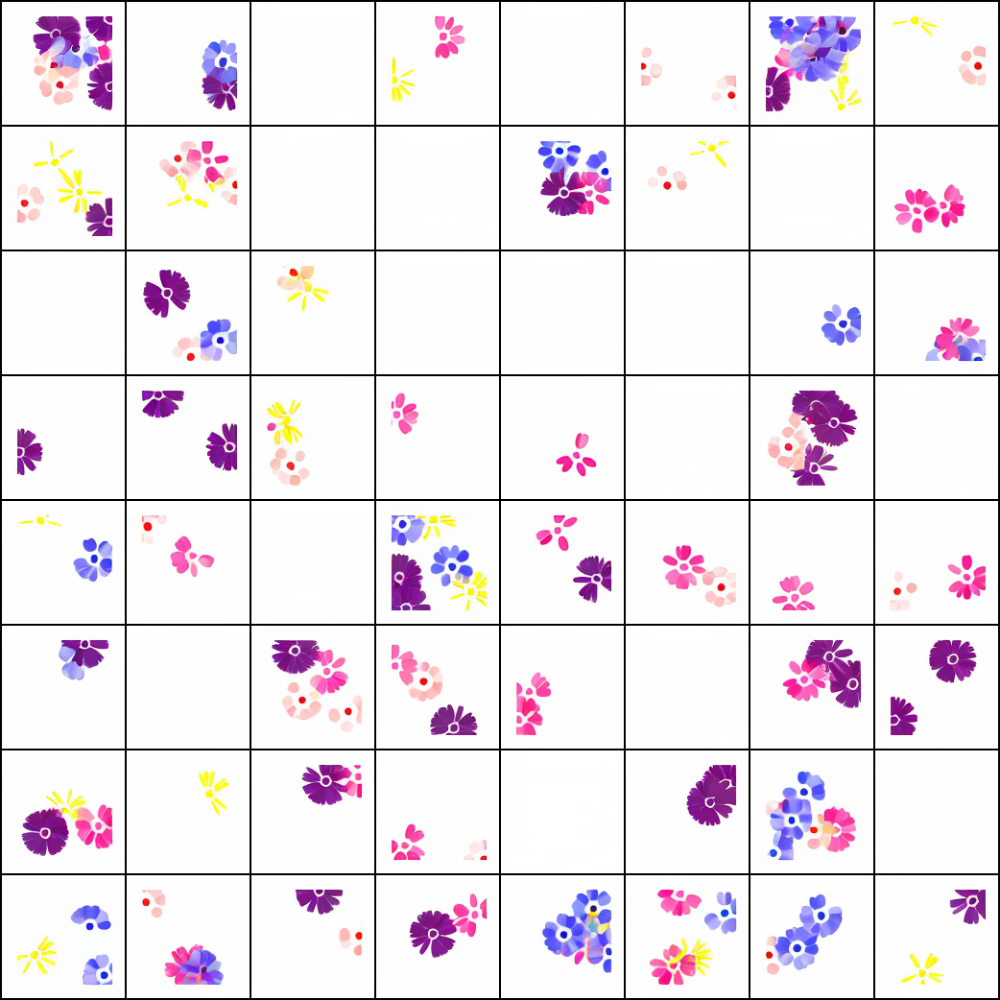

In [105]:
z = torch.randn(64, 4, 16, 16, device="cuda")
model_kwargs = {"y": torch.zeros(64, dtype=torch.int, device="cuda")}
device = "cuda"
diffusion_eval = create_diffusion(timestep_respacing="ddim100")  # default: ddim100, linear noise schedule
with torch.no_grad():
    latents = diffusion_eval.ddim_sample_loop(
        model.forward, z.shape, z, clip_denoised=False, model_kwargs=model_kwargs, progress=True, device=device
)
samples = vae.decode(latents / 0.18215).sample.cpu()
samples = (0.5 * samples + 0.5).clamp(0, 1)
to_imgrid(samples, nrow=8)

### Record the intermediate steps of diffusion sampling (Xt and pred x0)

In [8]:
diffusion_eval = create_diffusion(timestep_respacing="ddim25")

In [10]:
device = "cuda"












In [11]:
final = None
batch_size = 8
z = torch.randn(batch_size, 4, 16, 16, device="cuda")
model_kwargs = {"y": torch.zeros(batch_size, dtype=torch.int, device="cuda")}
intermediate_Xt = []
intermediate_pred_x0 = []
intermediate_Xt.append(z.clone().cpu())
for sample in diffusion_eval.ddim_sample_loop_progressive(
    model,
    z.shape,
    z,
    clip_denoised=False,
    denoised_fn=None,
    cond_fn=None,
    model_kwargs=model_kwargs,
    device=device,
    progress=True,
    eta=0.0,
):
    final = sample
    intermediate_Xt.append(sample["sample"].cpu())
    intermediate_pred_x0.append(sample["pred_xstart"].cpu())

intermediate_Xt = torch.stack(intermediate_Xt)
intermediate_pred_x0 = torch.stack(intermediate_pred_x0)
final["sample"];

  0%|          | 0/25 [00:00<?, ?it/s]

In [60]:
intermediate_Xt.shape

torch.Size([51, 8, 4, 16, 16])

In [12]:
pred_x0_traj = vae_decode_batch(vae, intermediate_pred_x0[:,4], batch_size=64)
xt_traj = vae_decode_batch(vae, intermediate_Xt[:,4], batch_size=64)

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1 [00:00<?, ?it/s]

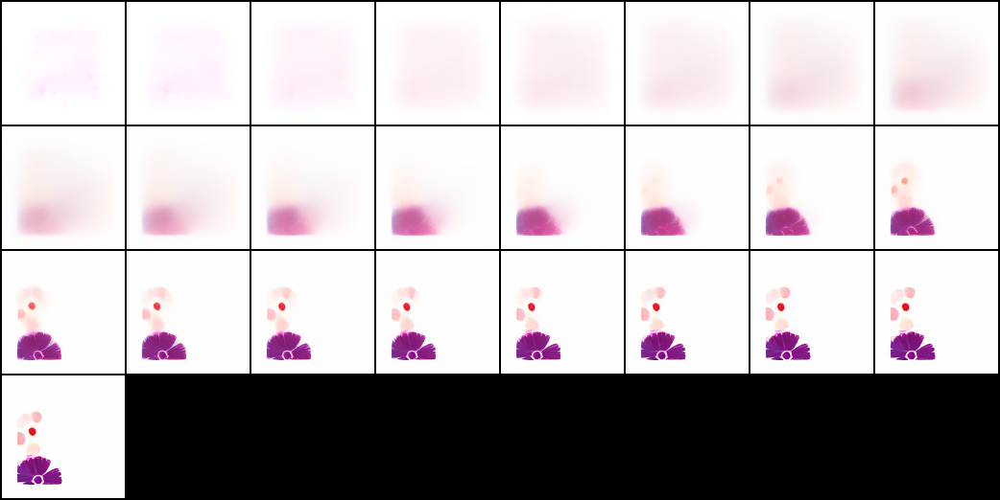

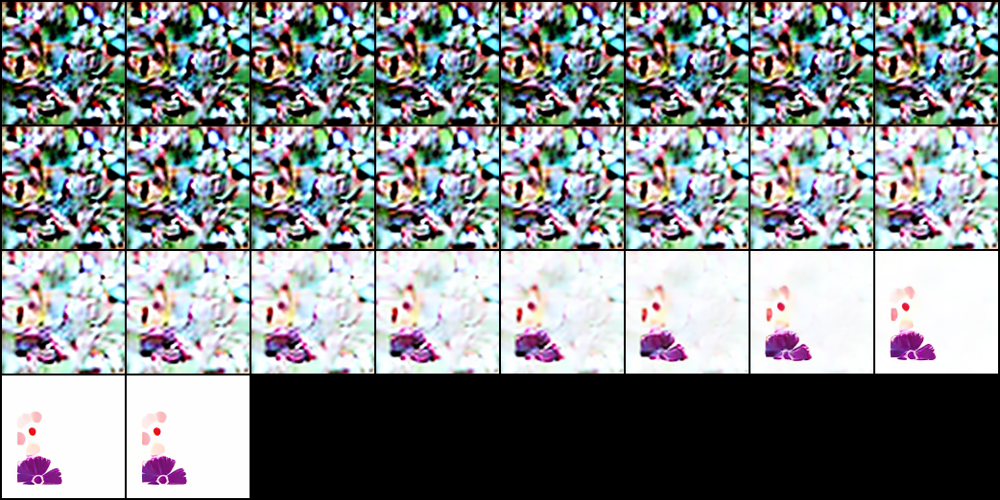

In [13]:
display(to_imgrid(pred_x0_traj))
display(to_imgrid(xt_traj))

### Examine the attention structure of one run

#### Hook the attention drop function

In [14]:
from copy import deepcopy
from collections import defaultdict
from circuit_toolkit.layer_hook_utils import featureFetcher_module

In [15]:
def toggle_fused_attn(model, fused_attn=True):
    for block in model.blocks:
        block.attn.fused_attn = fused_attn
    print(f"Fused attn turned {fused_attn}")
    return model


toggle_fused_attn(model, fused_attn=False);

Fused attn turned False


In [16]:
toggle_fused_attn(model, fused_attn=False);
fetcher = featureFetcher_module()
for blocki, block in enumerate(model.blocks):
    fetcher.record_module(block.attn.attn_drop, f"attn_{blocki}", store_device="cpu")

z = torch.randn(8, 4, 16, 16, device="cuda", generator=torch.Generator(device="cuda").manual_seed(0))
model.forward(z, t=torch.randn(z.shape[0], device="cuda"), y=torch.zeros(z.shape[0], dtype=torch.int, device="cuda"));
for key in fetcher.activations.keys():
    print(key, fetcher.activations[key].shape)

Fused attn turned False
attn_0 torch.Size([8, 6, 256, 256])
attn_1 torch.Size([8, 6, 256, 256])
attn_2 torch.Size([8, 6, 256, 256])
attn_3 torch.Size([8, 6, 256, 256])
attn_4 torch.Size([8, 6, 256, 256])
attn_5 torch.Size([8, 6, 256, 256])
attn_6 torch.Size([8, 6, 256, 256])
attn_7 torch.Size([8, 6, 256, 256])
attn_8 torch.Size([8, 6, 256, 256])
attn_9 torch.Size([8, 6, 256, 256])
attn_10 torch.Size([8, 6, 256, 256])
attn_11 torch.Size([8, 6, 256, 256])


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

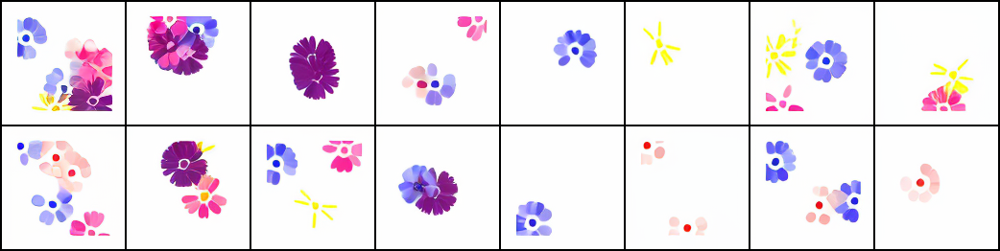

In [17]:
diffusion_eval = create_diffusion(timestep_respacing="ddim20")
final = None
batch_size = 16
z = torch.randn(batch_size, 4, 16, 16, device="cuda", 
                generator=torch.Generator(device="cuda").manual_seed(0))
model_kwargs = {"y": torch.zeros(batch_size, dtype=torch.int, device="cuda")}
intermediate_Xt = []
intermediate_pred_x0 = []
intermediate_Xt.append(z.clone().cpu())
attn_maps_organized = defaultdict(list)
for sample in diffusion_eval.ddim_sample_loop_progressive(
    model.forward,
    z.shape,
    z,
    clip_denoised=False,
    denoised_fn=None,
    cond_fn=None,
    model_kwargs=model_kwargs,
    device=device,
    progress=True,
    eta=0.0,
):
    final = sample
    intermediate_Xt.append(sample["sample"].cpu())
    intermediate_pred_x0.append(sample["pred_xstart"].cpu())
    # attn_maps.append(deepcopy(fetcher.activations))
    for key in fetcher.activations.keys():
        attn_maps_organized[key].append(fetcher.activations[key].clone().cpu())
intermediate_Xt = torch.stack(intermediate_Xt)
intermediate_pred_x0 = torch.stack(intermediate_pred_x0)
attn_maps_organized = {key: torch.stack(attn_maps_organized[key]) for key in attn_maps_organized.keys()}
images = vae_decode_batch(vae, final["sample"])
to_imgrid(images)

In [18]:
for key in attn_maps_organized.keys():
    print(key, attn_maps_organized[key].shape) # (num_sampling_steps, batch_size, num_heads, num_tokens, num_tokens)
attn_maps_stacked = torch.stack(list(attn_maps_organized.values()))
print("attn_maps_stacked.shape:", attn_maps_stacked.shape) # (num_layers, num_sampling_steps, batch_size, num_heads, num_tokens, num_tokens)
# make sure each attention map sums to 1
assert torch.allclose(attn_maps_organized["attn_11"].sum(dim=-1), torch.ones(1))
# make sure different time steps have different attn maps (not overwritten)
assert not torch.allclose(attn_maps_organized["attn_11"][0], attn_maps_organized["attn_11"][-1])
assert not torch.allclose(attn_maps_organized["attn_1"][0], attn_maps_organized["attn_11"][-1])

attn_0 torch.Size([20, 16, 6, 256, 256])
attn_1 torch.Size([20, 16, 6, 256, 256])
attn_2 torch.Size([20, 16, 6, 256, 256])
attn_3 torch.Size([20, 16, 6, 256, 256])
attn_4 torch.Size([20, 16, 6, 256, 256])
attn_5 torch.Size([20, 16, 6, 256, 256])
attn_6 torch.Size([20, 16, 6, 256, 256])
attn_7 torch.Size([20, 16, 6, 256, 256])
attn_8 torch.Size([20, 16, 6, 256, 256])
attn_9 torch.Size([20, 16, 6, 256, 256])
attn_10 torch.Size([20, 16, 6, 256, 256])
attn_11 torch.Size([20, 16, 6, 256, 256])
attn_maps_stacked.shape: torch.Size([12, 20, 16, 6, 256, 256])


### Visualize attention maps

In [20]:
import sys
sys.path.append("/n/home12/binxuwang/Github/DiffusionAttnConsistency")
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from core.attention_analysis_lib import *

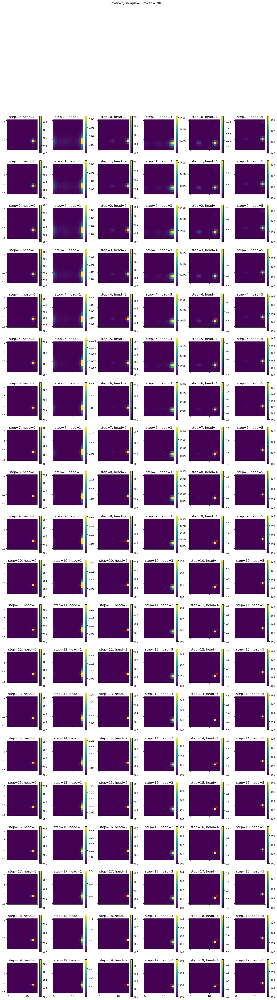

In [22]:
visualize_attn_maps(attn_maps_stacked, layer_idx=2, step_idx=None, sample_idx=6, head_idx=None, token_idx=190, 
                    row_dim="step", col_dim="head");

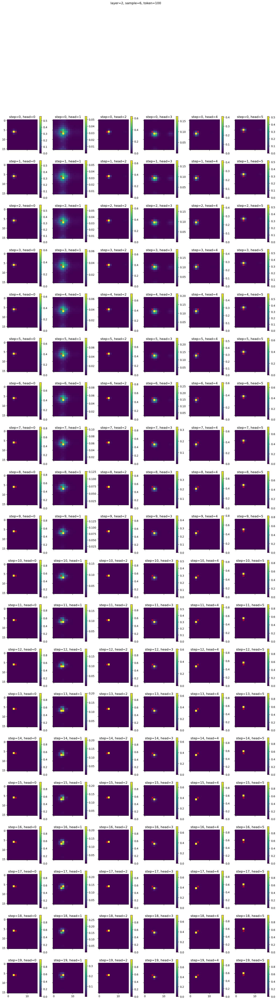

In [21]:
visualize_attn_maps(attn_maps_stacked, layer_idx=2, step_idx=None, sample_idx=6, head_idx=None, token_idx=100, 
                    row_dim="step", col_dim="head");

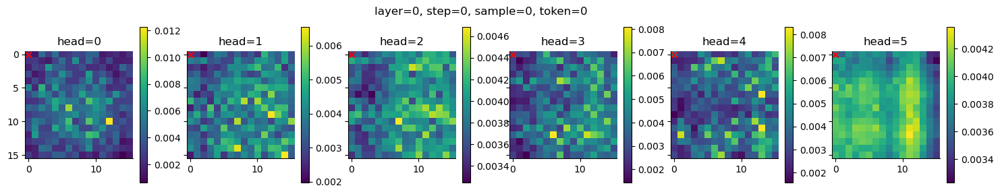

In [51]:
visualize_attn_maps(attn_maps_stacked, layer_idx=0, step_idx=0, sample_idx=0, head_idx=None, token_idx=0, cbar=True);

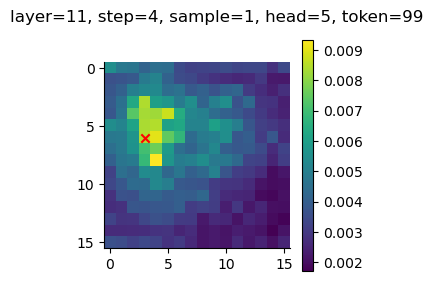

In [52]:
visualize_attn_maps(attn_maps_stacked, layer_idx=11, step_idx=4, sample_idx=1, head_idx=5, token_idx=99);

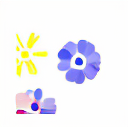

In [53]:
to_imgrid(images[6])

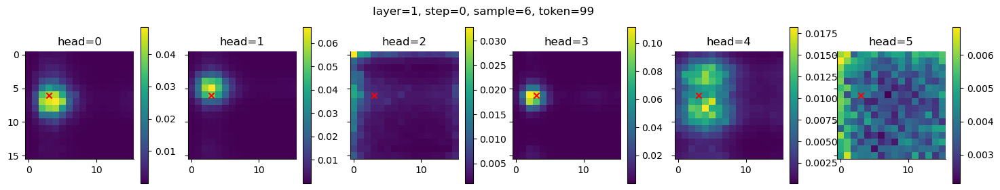

In [54]:
visualize_attn_maps(attn_maps_stacked, layer_idx=1, step_idx=0, sample_idx=6, head_idx=None, token_idx=99);

#### Layer x Attention head

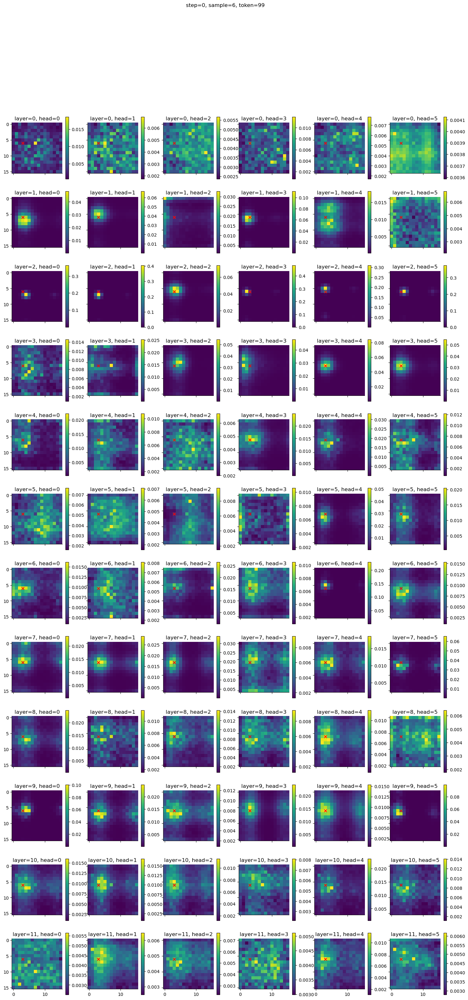

In [55]:
visualize_attn_maps(attn_maps_stacked, layer_idx=None, step_idx=0, sample_idx=6, head_idx=None, token_idx=99);

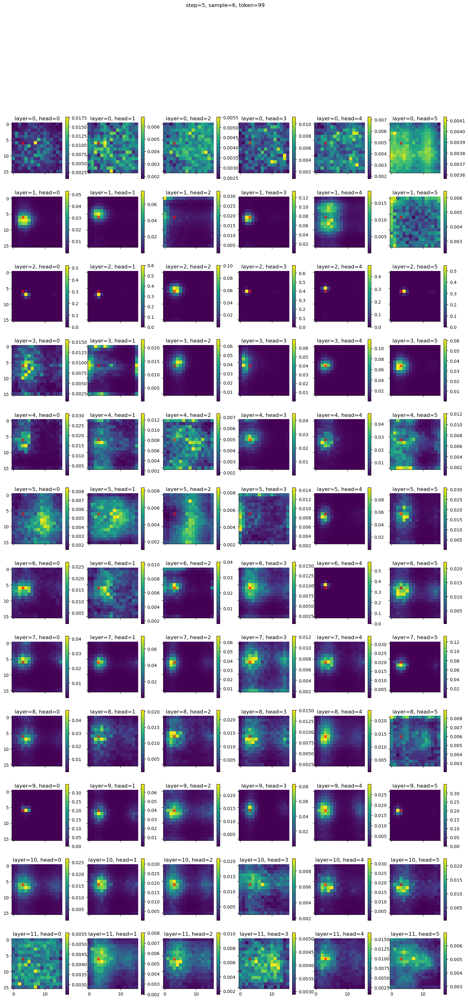

In [58]:
visualize_attn_maps(attn_maps_stacked, layer_idx=None, step_idx=5, sample_idx=6, head_idx=None, token_idx=99);

#### Step x Attention head

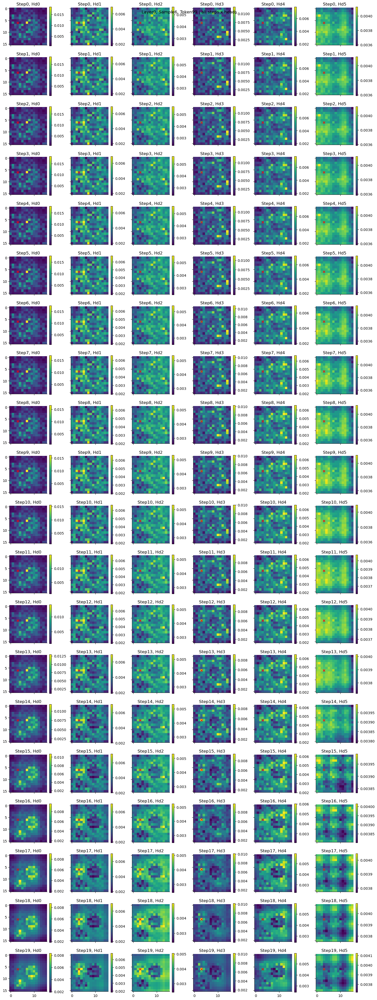

In [213]:
visualize_attn_maps(attn_maps_stacked, layer_idx=0, step_idx=None, sample_idx=6, head_idx=None, token_idx=99);

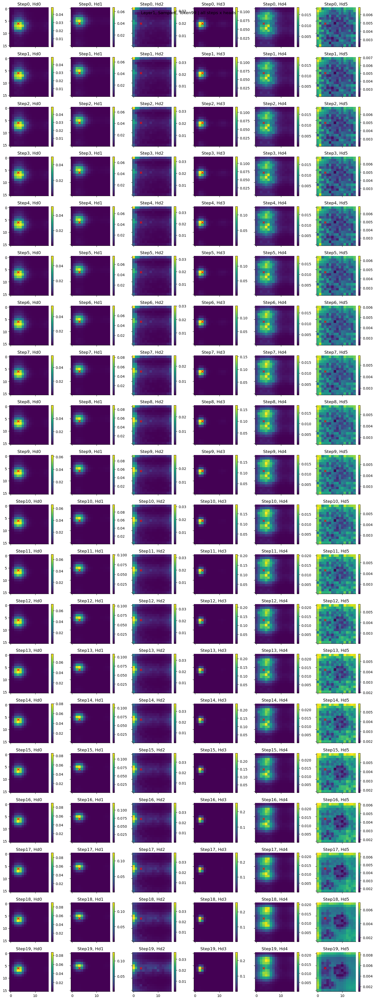

In [194]:
visualize_attn_maps(attn_maps_stacked, layer_idx=1, step_idx=None, sample_idx=6, head_idx=None, token_idx=99);

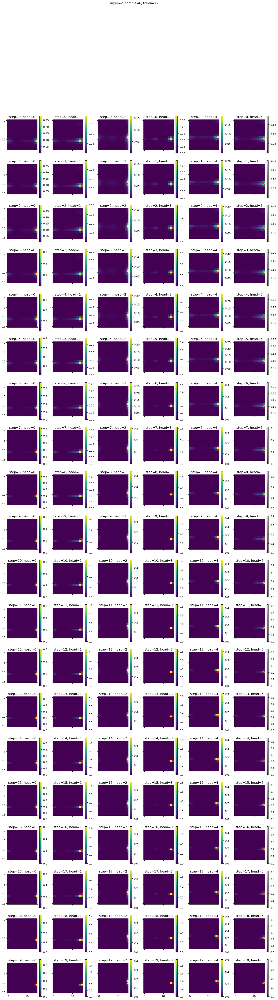

In [62]:
visualize_attn_maps(attn_maps_stacked, layer_idx=2, step_idx=None, sample_idx=6, head_idx=None, token_idx=175, 
                    row_dim="step", col_dim="head");

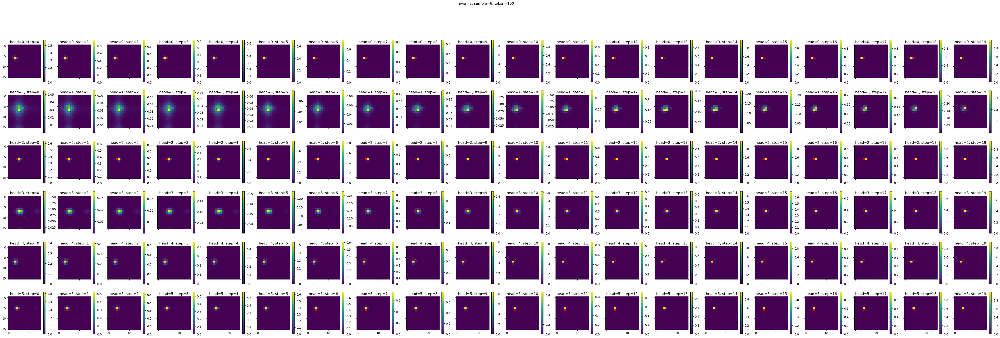

In [133]:
visualize_attn_maps(attn_maps_stacked, layer_idx=2, step_idx=None, sample_idx=6, head_idx=None, token_idx=100, 
                    row_dim="head", col_dim="step");

In [ ]:
visualize_attn_maps(attn_maps_stacked, layer_idx=2, step_idx=None, sample_idx=6, head_idx=None, token_idx=100, 
                    row_dim="head", col_dim="step");

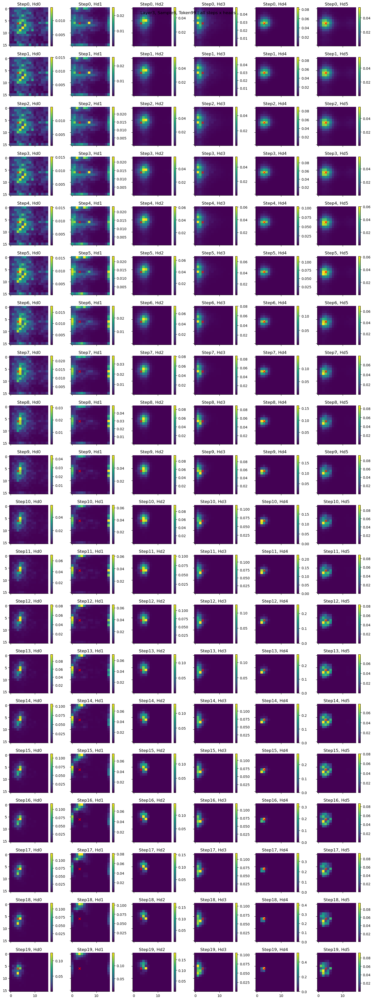

In [195]:
visualize_attn_maps(attn_maps_stacked, layer_idx=3, step_idx=None, sample_idx=6, head_idx=None, token_idx=99);

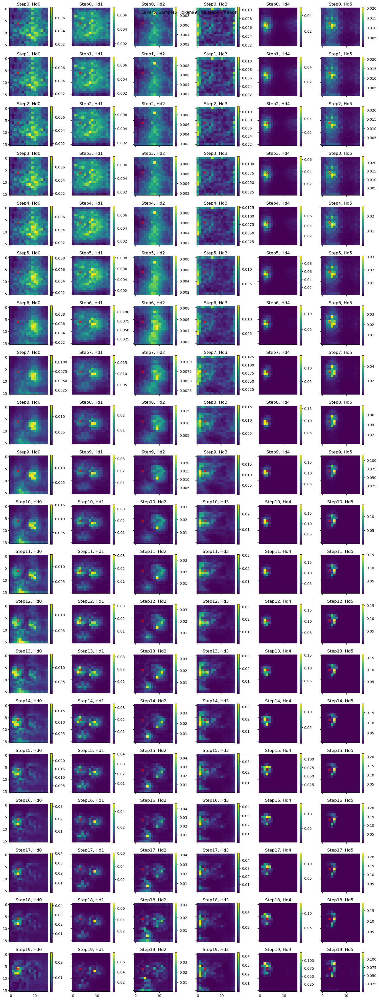

In [196]:
visualize_attn_maps(attn_maps_stacked, layer_idx=5, step_idx=None, sample_idx=6, head_idx=None, token_idx=99);

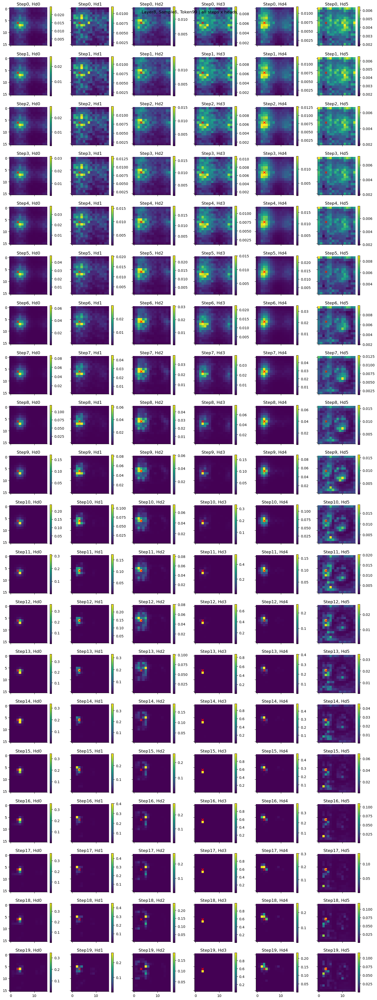

In [197]:
visualize_attn_maps(attn_maps_stacked, layer_idx=8, step_idx=None, sample_idx=6, head_idx=None, token_idx=99);

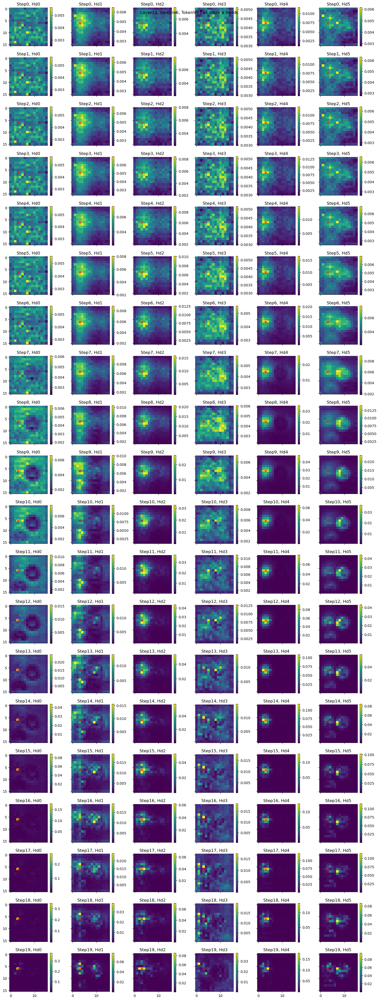

In [198]:
visualize_attn_maps(attn_maps_stacked, layer_idx=11, step_idx=None, sample_idx=6, head_idx=None, token_idx=99);

## Compute some statistics of attention maps

In [117]:
%load_ext autoreload
%autoreload 2

import sys
sys.path.append("/n/home12/binxuwang/Github/DiffusionAttnConsistency")
from core.attention_analysis_lib import *

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


torch.Size([12, 20, 16, 6])


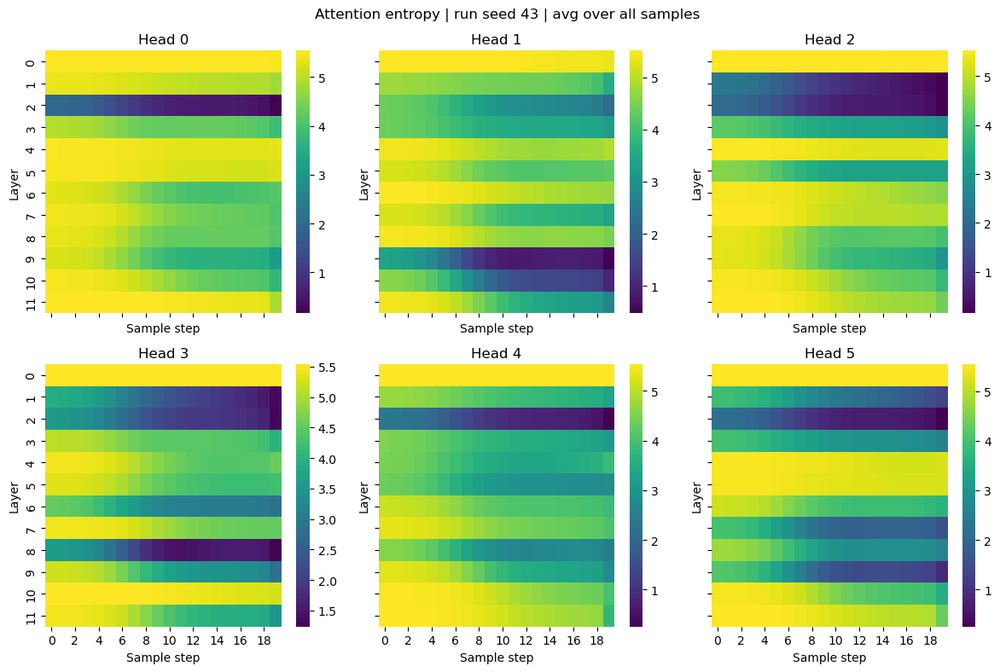

In [127]:
attn_entropy = compute_entropy_last_dim(attn_maps_stacked, dim=-1)
attn_entropy_token_mean = attn_entropy.mean(dim=-1)
print(attn_entropy_token_mean.shape)
plot_attention_layer_head_heatmaps(attn_entropy_token_mean, title_str="Attention entropy | run seed 43", figsize=(12, 8), sample_idx=None, )

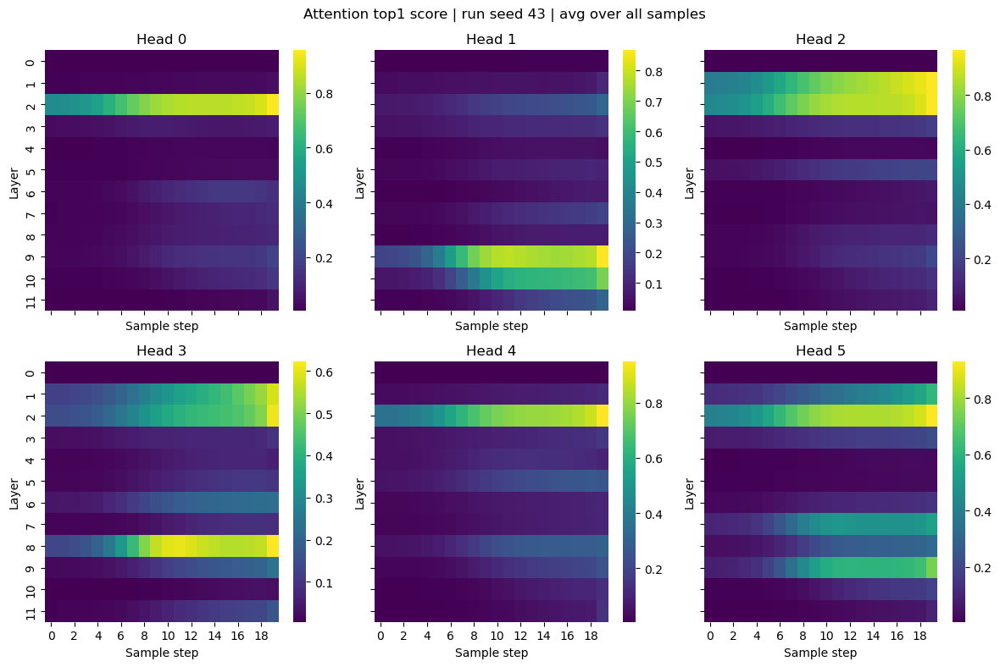

In [128]:
attn_top1_score = top_k_attention_score(attn_maps_stacked, k=1, dim=-1)
attn_top1_score_token_mean = attn_top1_score.mean(dim=-1)
plot_attention_layer_head_heatmaps(attn_top1_score_token_mean, title_str="Attention top1 score | run seed 43", figsize=(12, 8), sample_idx=None, num_heads=6)

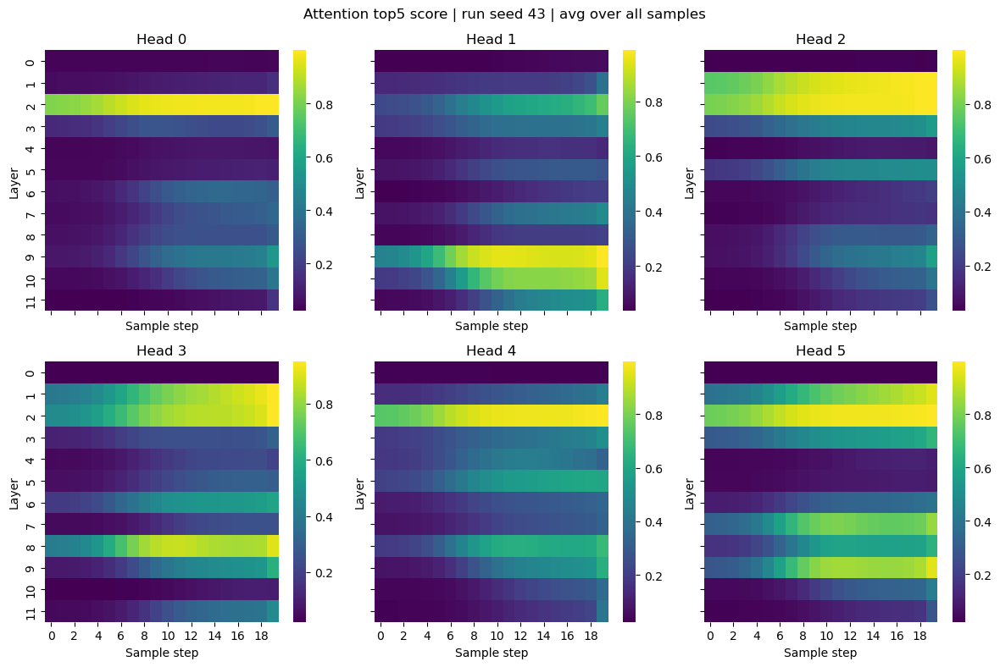

In [129]:
attn_top5_score = top_k_attention_score(attn_maps_stacked, k=5, dim=-1)
attn_top5_score_token_mean = attn_top5_score.mean(dim=-1)
plot_attention_layer_head_heatmaps(attn_top5_score_token_mean, title_str="Attention top5 score | run seed 43", figsize=(12, 8), sample_idx=None, num_heads=6)


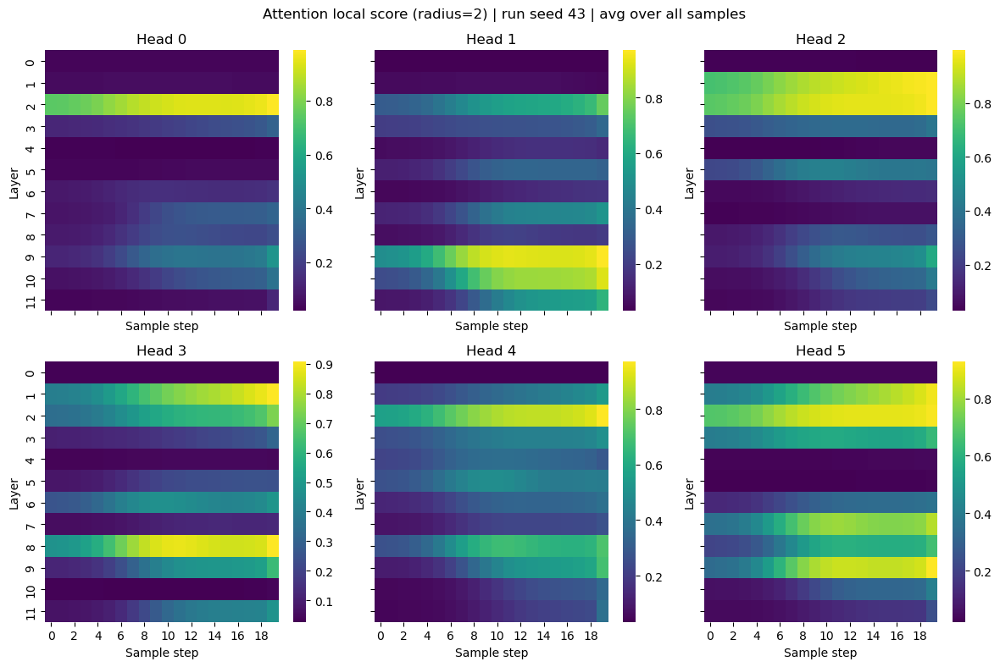

In [130]:
attn_local_rad2_score = local_attention_score(attn_maps_stacked, dist_type="L2", threshold=2.0)
attn_local_rad2_score_token_mean = attn_local_rad2_score.mean(dim=-1)
plot_attention_layer_head_heatmaps(attn_local_rad2_score_token_mean, title_str="Attention local score (radius=2) | run seed 43", figsize=(12, 8), sample_idx=None, num_heads=6)

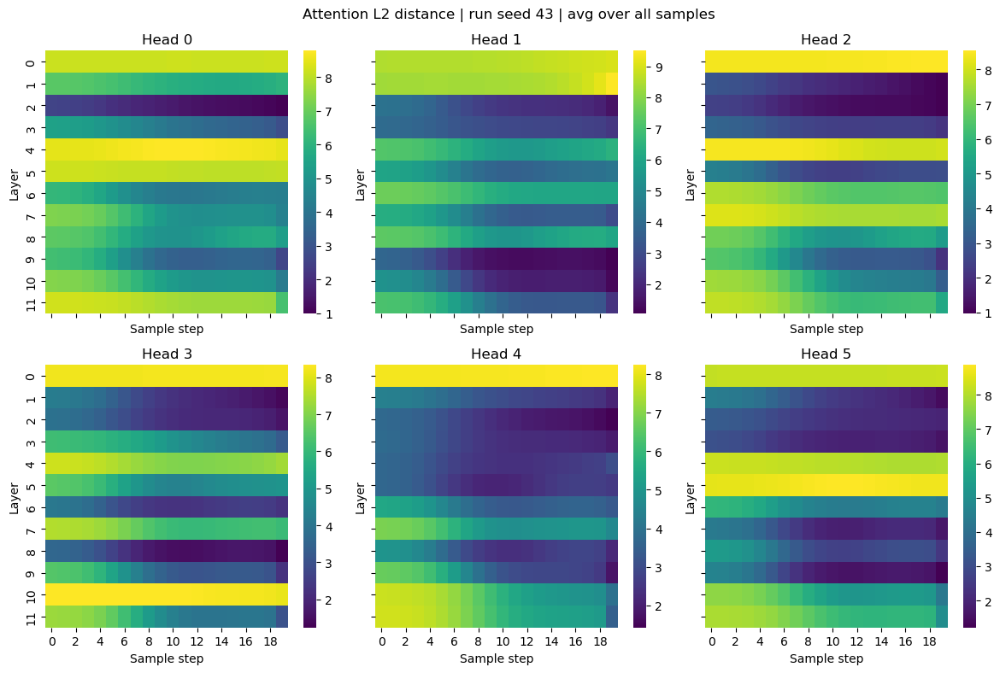

In [131]:
attn_avg_dist = average_attention_distance(attn_maps_stacked, dist_type="L2")
attn_avg_dist_token_mean = attn_avg_dist.mean(dim=-1)
plot_attention_layer_head_heatmaps(attn_avg_dist_token_mean, title_str="Attention L2 distance | run seed 43", figsize=(12, 8), sample_idx=None, num_heads=6)

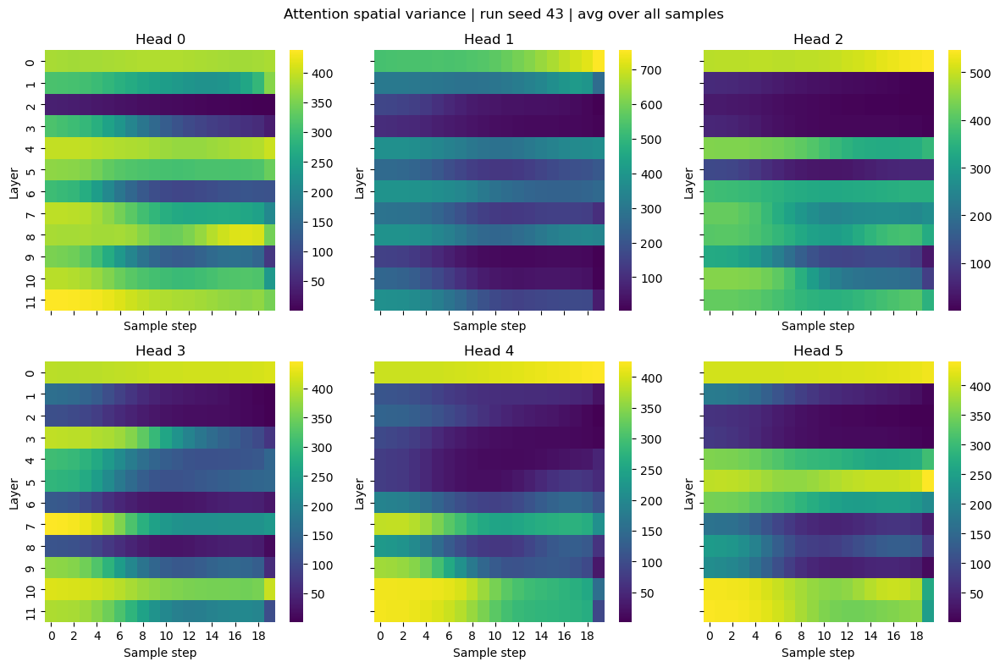

In [132]:
attn_weighted_var = attention_spatial_variance(attn_maps_stacked)
attn_weighted_var_token_mean = attn_weighted_var.mean(dim=-1)
attn_weighted_var_token_mean.shape
plot_attention_layer_head_heatmaps(attn_weighted_var_token_mean, title_str="Attention spatial variance | run seed 43", figsize=(12, 8), sample_idx=None, num_heads=6)

## Pairwise Similarity of attention maps / heads

In [ ]:
import einops
# this summarize the behavior across sample 
attn_maps_stacked_flat = einops.rearrange(attn_maps_stacked, "lyr step samp head tokenQ tokenK -> (lyr step head) (samp tokenQ tokenK)")
corr_matrix = torch.corrcoef(attn_maps_stacked_flat)

In [150]:
torch.save(attn_maps_stacked, "/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/DiffusionAttnConsistency/DiT/flowers_results/010-flower_latents10k_pilots-uncond-DiT-S-1-flower_latents10k_pilots_seed43_20250625-1754/attn_maps_stacked.pt")

In [151]:
!du -sh /n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/DiffusionAttnConsistency/DiT/flowers_results/010-flower_latents10k_pilots-uncond-DiT-S-1-flower_latents10k_pilots_seed43_20250625-1754/attn_maps_stacked.pt

5.7G	/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/DiffusionAttnConsistency/DiT/flowers_results/010-flower_latents10k_pilots-uncond-DiT-S-1-flower_latents10k_pilots_seed43_20250625-1754/attn_maps_stacked.pt


In [143]:
n_layers = attn_maps_stacked.shape[0]
n_steps = attn_maps_stacked.shape[1]
n_heads = attn_maps_stacked.shape[3]
n_tokens = attn_maps_stacked.shape[4]
layer_vec = torch.arange(n_layers)
step_vec = torch.arange(n_steps)
head_vec = torch.arange(n_heads)
layer_tsr = layer_vec.view(-1, 1, 1).expand(n_layers, n_steps, n_heads)
step_tsr = step_vec.view(1, -1, 1).expand(n_layers, n_steps, n_heads)
head_tsr = head_vec.view(1, 1, -1).expand(n_layers, n_steps, n_heads)
layer_label = layer_tsr.flatten()
step_label = step_tsr.flatten()
head_label = head_tsr.flatten()

print(layer_tsr.shape)
print(step_tsr.shape)
print(head_tsr.shape)

torch.Size([12, 20, 6])
torch.Size([12, 20, 6])
torch.Size([12, 20, 6])


/n/home12/binxuwang/.conda/envs/torch2/lib/python3.10/site-packages/sklearn/manifold/_mds.py:632: UserWarning: The MDS API has changed. ``fit`` now constructs an dissimilarity matrix from data. To use a custom dissimilarity matrix, set ``dissimilarity='precomputed'``.
  warnings.warn(


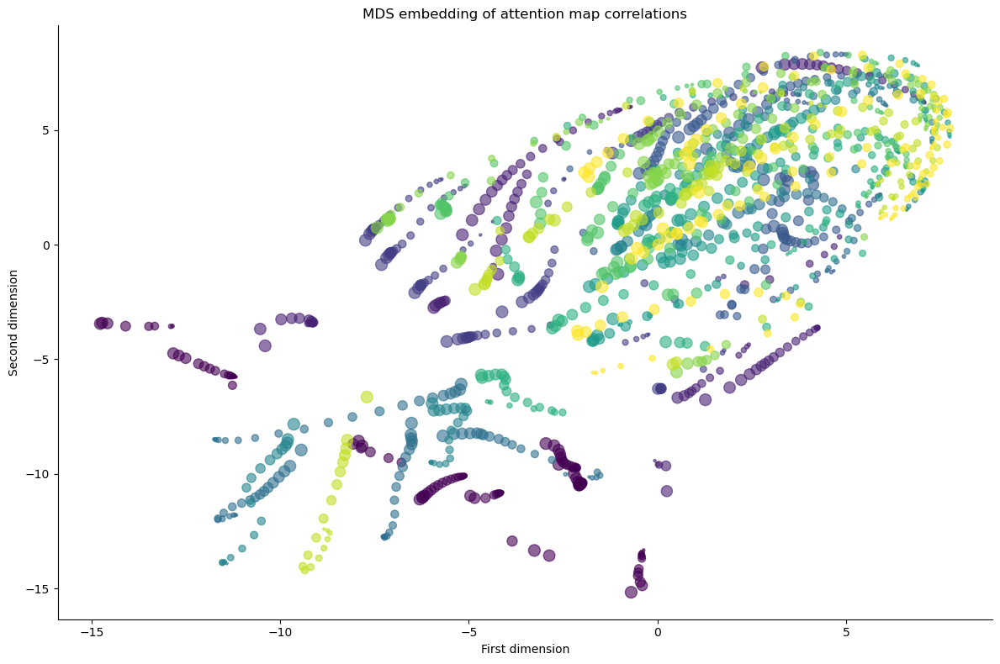

In [ ]:
# Compute low-dimensional embedding using MDS
from sklearn.manifold import MDS, TSNE
mds = MDS(n_components=2, random_state=42)
corr_matrix_np = corr_matrix.cpu().numpy()
embedding = mds.fit_transform(corr_matrix_np)

# Create figure
plt.figure(figsize=(12,8))

# Create labels for each point
labels = [f"L{i}Hd{k}, Step{j}" for i, j, k in zip(layer_label, step_label, head_label)]
# norm = plt.Normalize(colors.min(), colors.max())
scatter = plt.scatter(embedding[:, 0], embedding[:, 1],
                     c=layer_label.numpy(),
                     s=(step_label.numpy() + 1) * 5,
                     cmap='viridis',
                     alpha=0.6,
                     )

# plt.colorbar(scatter, label="Layer index")
plt.title("MDS embedding of attention map correlations")
plt.xlabel("First dimension")
plt.ylabel("Second dimension")

# Add hover annotations
annot = plt.annotate("", xy=(0,0), xytext=(10,10),
                    textcoords="offset points",
                    bbox=dict(boxstyle="round", fc="w", ec="0.5", alpha=0.9),
                    arrowprops=dict(arrowstyle="->"))
annot.set_visible(False)

def hover(event):
    if event.inaxes == plt.gca():
        cont, ind = scatter.contains(event)
        if cont:
            annot.xy = (embedding[ind["ind"][0], 0], embedding[ind["ind"][0], 1])
            annot.set_text(labels[ind["ind"][0]])
            annot.set_visible(True)
            plt.draw()
        else:
            annot.set_visible(False)
            plt.draw()

plt.gcf().canvas.mpl_connect("motion_notify_event", hover)
plt.tight_layout()


In [149]:
import plotly.express as px
import pandas as pd
import numpy as np

# example data
df = pd.DataFrame({
    "x": np.random.randn(100),
    "y": np.random.randn(100),
    "label": [f"pt {i}" for i in range(100)]
})

# scatter with hover labels
fig = px.scatter(
    df,
    x="x",
    y="y",
    hover_name="label",        # what to show on hover
    title="Plotly hover labels in VS Code"
)
fig.show()

AttributeError: module 'plotly.validators.surface' has no attribute 'ColorbarValidator'

In [136]:
np.prod([12, 20, 16, 6])

23040

In [ ]:
# Reshape attention maps to 2D matrix (num_maps x num_tokens)
num_maps = 12 * 20 * 16 * 6  # layers * steps * samples * heads
num_tokens = 256  # tokens per map
attn_maps_flat = attn_maps_stacked.reshape(num_maps, num_tokens, num_tokens)

# Calculate correlation matrix between flattened attention maps
corr_matrix = torch.corrcoef(attn_maps_flat.reshape(num_maps, -1))

# Plot correlation matrix
plt.figure(figsize=(12,12))
plt.imshow(corr_matrix.cpu(), cmap='RdBu', vmin=-1, vmax=1)
plt.colorbar()
plt.title("Correlation between attention maps")
plt.tight_layout()


In [ ]:
def plot_single_attn_map(ax, attn_map, token_idx=None, map_shape=(16, 16), use_heatmap=False, cbar=True):
    """Plot a single attention map on the given axes.
    
    Args:
        ax: matplotlib axes to plot on
        attn_map: attention map tensor of shape (num_tokens)
        token_idx: index of token to highlight
        map_shape: shape of the attention map (H,W)
        use_heatmap: whether to use seaborn heatmap instead of imshow
    """
    if use_heatmap:
        sns.heatmap(attn_map.reshape(map_shape), cmap="viridis", ax=ax, cbar=cbar)
    else:
        im = ax.imshow(attn_map.reshape(map_shape), cmap="viridis")
        if cbar:
            cbar = ax.figure.colorbar(im, ax=ax)
    if token_idx is not None:
        H_idx, W_idx = np.unravel_index(token_idx, map_shape)
        if use_heatmap:
            H_idx = H_idx + 0.5
            W_idx = W_idx + 0.5
        ax.scatter(W_idx, H_idx, color="red", marker="x")
    ax.set_aspect("equal")
    return im


def visualize_attn_maps_old(attn_maps_stacked, layer_idx, step_idx, sample_idx, head_idx, token_idx, map_shape=(16, 16), use_heatmap=False):
    """
    Visualize attention maps with different slicing options.
    
    attn_maps_stacked has shape (num_layers, num_steps, num_samples, num_heads, num_tokens, num_tokens)
    """
    n_layers, n_steps, n_samples, n_heads, n_tokens, _ = attn_maps_stacked.shape
    
    # Single head case
    if head_idx is not None:
        fig, ax = plt.subplots()
        attn_map = attn_maps_stacked[layer_idx,step_idx,sample_idx,head_idx,token_idx,:]
        plot_single_attn_map(ax, attn_map, token_idx, map_shape, use_heatmap)
        return fig
        
    # Multiple heads cases
    if layer_idx is not None and step_idx is not None:
        # Plot all heads for given layer and step
        fig, axs = plt.subplots(2, 3, figsize=(12, 8), sharex=True, sharey=True)
        axs = axs.flatten()
        for head_idx in range(n_heads):
            attn_map = attn_maps_stacked[layer_idx,step_idx,sample_idx,head_idx,token_idx,:]
            plot_single_attn_map(axs[head_idx], attn_map, token_idx, map_shape, use_heatmap)
            axs[head_idx].set_title(f"Head {head_idx}")
        plt.suptitle(f"Layer{layer_idx}, Step{step_idx}, Sample{sample_idx}, Token{token_idx} | all heads")
            
    elif layer_idx is None and step_idx is not None:
        # Plot all layers x heads for given step
        fig, axs = plt.subplots(n_layers, n_heads, figsize=(15, 30), sharex=True, sharey=True)
        for layer_idx in range(n_layers):
            for head_idx in range(n_heads):
                attn_map = attn_maps_stacked[layer_idx,step_idx,sample_idx,head_idx,token_idx,:]
                plot_single_attn_map(axs[layer_idx,head_idx], attn_map, token_idx, map_shape, use_heatmap)
                axs[layer_idx,head_idx].set_title(f"Lyr{layer_idx}, Hd{head_idx}")
        plt.suptitle(f"Step{step_idx}, Sample{sample_idx}, Token{token_idx} | all layers x heads")
            
    elif step_idx is None and layer_idx is not None:
        # Plot all steps x heads for given layer
        fig, axs = plt.subplots(n_steps, n_heads, figsize=(15, 40), sharex=True, sharey=True)
        for step_idx in range(n_steps):
            for head_idx in range(n_heads):
                attn_map = attn_maps_stacked[layer_idx,step_idx,sample_idx,head_idx,token_idx,:]
                plot_single_attn_map(axs[step_idx,head_idx], attn_map, token_idx, map_shape, use_heatmap)
                axs[step_idx,head_idx].set_title(f"Step{step_idx}, Hd{head_idx}")
        plt.suptitle(f"Layer{layer_idx}, Sample{sample_idx}, Token{token_idx} | all steps x heads")
    
    plt.tight_layout()
    return fig

In [ ]:
def visualize_attn_maps(
    attn_maps, 
    layer_idx, step_idx, sample_idx, head_idx, token_idx, 
    row_dim='layer', 
    col_dim='head',
    map_shape=(16,16),
    use_heatmap=False,
    cbar=True,
):
    """
    attn_maps: shape (L, S, N, H, T, T)
    fixed: dict of the two dims you want to hold constant, e.g. {'step':3, 'head':1}
    row_dim, col_dim: the two dims you want to vary along rows and columns of subplots
    """
    # possible dims
    fixed = {}
    if layer_idx is not None:
        fixed['layer'] = layer_idx
    if step_idx is not None:
        fixed['step'] = step_idx
    if sample_idx is not None:
        fixed['sample'] = sample_idx
    if head_idx is not None:
        fixed['head'] = head_idx
    if token_idx is not None:
        fixed['token'] = token_idx
    dims = {
        'layer': attn_maps.shape[0],
        'step' : attn_maps.shape[1],
        'sample': attn_maps.shape[2],
        'head' : attn_maps.shape[3],
        'token': attn_maps.shape[4],
         None: 1 # when some dim is None, it means it's singleton
    }
    non_fixed_dims = set(dims) - set(fixed) - {None}
    assert row_dim in dims and col_dim in dims
    if len(non_fixed_dims) == 0:
        row_dim = None
        col_dim = None
    elif len(non_fixed_dims) == 1:
        col_dim = non_fixed_dims.pop()
        row_dim = None
    elif len(non_fixed_dims) == 2:
        if row_dim is None or col_dim is None:
            row_dim = non_fixed_dims.pop()
            col_dim = non_fixed_dims.pop()
        else:
            assert row_dim in non_fixed_dims and col_dim in non_fixed_dims
    else:
        raise ValueError(f"non_fixed_dims must have length 0, 1, or 2, got {non_fixed_dims}")
    # sanity check
    row_vals = range(dims[row_dim])
    col_vals = range(dims[col_dim])

    fig, axs = plt.subplots(
        len(row_vals), len(col_vals),
        figsize=(3*len(col_vals), 3*len(row_vals)),
        sharex=True, sharey=True, squeeze=False
    )

    # make sure axs is 2D
    axs = np.atleast_2d(axs)

    for i, r in enumerate(row_vals):
        for j, c in enumerate(col_vals):
            idxs = {
                row_dim: r,
                col_dim: c,
                **fixed
            }
            # pull out the attention map slice
            attn_map = attn_maps[
                idxs['layer'],
                idxs['step'],
                sample_idx,
                idxs['head'],
                token_idx,
                :
            ]
            ax = axs[i, j]
            plot_single_attn_map(
                ax, attn_map, token_idx,
                map_shape, use_heatmap, cbar
            )
            ax.set_title(", ".join([f"{k}={v}" for k,v in [(row_dim, r), (col_dim, c)] if k is not None]))
            # ax.set_title(f"{row_dim}={r}, {col_dim}={c}")
    plt.suptitle(", ".join([f"{k}={v}" for k, v in fixed.items()]))
    # plt.tight_layout()
    return fig